In [1]:
%load_ext autoreload
%autoreload 2

# Set Seed
import utils as utils

utils.set_seed(77)

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import shutil

import img_check as img_check

from PIL import Image
# from basic_image_eda import BasicImageEDA

In [3]:
os.getcwd()

'/home/chrisho/Projects/fedseg/eda_chase_57'

##  <b>Data Preparation and Partition

The CHASEDB1 database is stratified into

    * left eye set
    * right eye set
    * 1st Manual Annotator left eye masks set
    * 2nd Manual Annotator left eye masks set
    * 1st Manual Annotator right eye masks set
    * 2nd Manual Annotator right eye masks set
    * Full left and Right eye set
 
The CHASEDB1 database is then randomly sampled from left eye set and right eye set without replacement into 3 partitions. The corresponding masks from 1st Manual Annotator are also separated accordingly to the partitions.
    
    * partition 1
    * partition 2
    * partition 3

In [4]:
# Create data path and folders path
data_path = os.path.join(os.getcwd(), 'data/CHASEDB1')
stratify_path = os.path.join(os.getcwd(), 'data/stratify_chasedb1')
folders = ['all','left','right','L_1stHO','R_1stHO','L_2ndHO','R_2ndHO']

# Move images from database to stratified folders accordingly
utils.stratify_folders(data_path, stratify_path, folders)

In [5]:
# Create 3 partitions of left/right eye with masks accordingly

# Create images and masks file paths
left_image_paths = utils.get_files_path('data/stratify_chasedb1/left')
left_mask_1_paths = utils.get_files_path('data/stratify_chasedb1/L_1stHO/')
right_image_paths = utils.get_files_path('data/stratify_chasedb1/right')
right_mask_1_paths = utils.get_files_path('data/stratify_chasedb1/R_1stHO/')

# Create left eye image with left eye mask dictionary
left_image_mask_dict = utils.create_image_mask_dict(left_image_paths, left_mask_1_paths)

# Create right eye image with right eye mask dictionary
right_image_mask_dict = utils.create_image_mask_dict(right_image_paths, right_mask_1_paths)

# Create data partition folder path
partition_path = os.path.join(os.getcwd(), 'data/partition')

# Move left eye images and masks accordingly to the partition
utils.create_partitions(left_image_mask_dict, partition_path, 3)

# Move right eye images and mask accordingly to the partition
utils.create_partitions(right_image_mask_dict, partition_path, 3)

Completed
Completed


In [6]:
# get all the folders path in the stratify folders

folders_path = utils.get_folders_path(stratify_path)
folders_path

['/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/left',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/right']

In [7]:
# check for image count and image validation in stratify folder

for folder_path in folders_path:
    file_paths = utils.get_files_path(folder_path)
    print('Number of files in {} is/are {}'.format(folder_path, len(file_paths)))
    img_check.imagefile(file_paths)
    print('')

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO is/are 14
Images are valid and formats found are {'PNG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO is/are 14
Images are valid and formats found are {'PNG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO is/are 14
Images are valid and formats found are {'PNG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO is/are 14
Images are valid and formats found are {'PNG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all is/are 28
Images are valid and formats found are {'JPEG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/left is/are 14
Images are valid and formats found are {'JPEG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/right is/are 1

<b>Quick Note of Count:

    * The count between left and right eyes are 14, the number of masks of both manual annotators also tallies.
    * No invalid images found.

In [8]:
# get all the folders path in the image partitioned folders

image_partition_paths = utils.get_folders_path(os.path.join(partition_path, 'images'))
image_partition_paths

['/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/1',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/2',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/3']

In [9]:
# check for image count and image validation in image partition folder

for folder_path in image_partition_paths:
    file_paths = utils.get_files_path(folder_path)
    print('Number of files in {} is/are {}'.format(folder_path, len(file_paths)))
    img_check.imagefile(file_paths)
    print('')

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/1 is/are 10
Images are valid and formats found are {'JPEG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/2 is/are 10
Images are valid and formats found are {'JPEG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/3 is/are 8
Images are valid and formats found are {'JPEG'}



In [10]:
# get all the folders path in the mask partitioned folders

mask_partition_paths = utils.get_folders_path(os.path.join(partition_path, 'mask'))
mask_partition_paths

['/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/1',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/2',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/3']

In [11]:
# check for image count and image validation in mask partition folder

for folder_path in mask_partition_paths:
    file_paths = utils.get_files_path(folder_path)
    print('Number of files in {} is/are {}'.format(folder_path, len(file_paths)))
    img_check.imagefile(file_paths)
    print('')

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/1 is/are 10
Images are valid and formats found are {'PNG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/2 is/are 10
Images are valid and formats found are {'PNG'}

Number of files in /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/3 is/are 8
Images are valid and formats found are {'PNG'}



<b> Quick check on Image Mode

In [12]:
# check for image mode

for folder_path in folders_path:
    file_paths = utils.get_files_path(folder_path)
    print('Checking {}'.format(folder_path))
    img_check.imagemode(file_paths)
    print('')

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO
Images mode found are {'1'}

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO
Images mode found are {'1'}

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO
Images mode found are {'1'}

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO
Images mode found are {'1'}

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all
Images mode found are {'RGB'}

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/left
Images mode found are {'RGB'}

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/right
Images mode found are {'RGB'}



<b> Quick check on Image Mode
    
    * 1 (1-bit pixels, black and white, stored with one pixel per byte)
    * RGB (3x8-bit pixels, true color)

<b> Quick check on Image Height

In [13]:
# check for image minimum and maximum height

for folder_path in folders_path:
    file_paths = utils.get_files_path(folder_path)
    print('Checking {}'.format(folder_path))
    img_check.minmax_height(file_paths)
    print('')

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO
Min Height is 960 and Max Height is 960

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO
Min Height is 960 and Max Height is 960

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO
Min Height is 960 and Max Height is 960

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO
Min Height is 960 and Max Height is 960

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all
Min Height is 960 and Max Height is 960

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/left
Min Height is 960 and Max Height is 960

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/right
Min Height is 960 and Max Height is 960



<b>All images have the same min and max height</b>

In [14]:
# check for image minimum and maximum width

for folder_path in folders_path:
    file_paths = utils.get_files_path(folder_path)
    print('Checking {}'.format(folder_path))
    img_check.minmax_width(file_paths)
    print('')

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO
Min Width is 999 and Max Width is 999

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO
Min Width is 999 and Max Width is 999

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO
Min Width is 999 and Max Width is 999

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO
Min Width is 999 and Max Width is 999

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all
Min Width is 999 and Max Width is 999

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/left
Min Width is 999 and Max Width is 999

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/right
Min Width is 999 and Max Width is 999



<b>All images have the same min and max width </b>

In [15]:
# Check for average mean per channel for each folder

for folder_path in folders_path:
    file_paths = utils.get_files_path(folder_path)
    print('Checking {}'.format(folder_path))
    average = img_check.avg_mean(file_paths)
    print('Average mean of pixel each band is {}'.format(average))
    print('')

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO
Average mean of pixel each band is [17.74098094 17.74098094 17.74098094]

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO
Average mean of pixel each band is [17.10517884 17.10517884 17.10517884]

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO
Average mean of pixel each band is [17.62201375 17.62201375 17.62201375]

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO
Average mean of pixel each band is [16.74994861 16.74994861 16.74994861]

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all
Average mean of pixel each band is [115.48913195  41.80070841   7.12380811]

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/left
Average mean of pixel each band is [119.01949256  44.22995034   8.25329511]

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/st

<b> Difference of average mean of pixel each band between stratifiable elements

L_1stHO = 17.74 vs L_2ndHO = 17.11 (difference of 0.63)

R_1stHO = 17.62 vs R_2ndHO = 16.75 (difference of 0.87)

left_R = 119.019 vs right_R = 111.96 (difference of 7.06)

left_G = 44.22 vs right_G = 39.37 (difference of 4.85)

left_B = 8.25 vs right_B = 6.00 (difference of 2.25)
    
left_right_R = 115.45

left_right_G = 41.80
    
left_right_B = 7.12

## <b> Average Black and White Ratio of Masks

In [16]:
folders_path[0:4]

['/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO']

In [17]:
# Check average ratio of white pixels against black pixels in each of the 4 masks folders
# 0 is black, 255 is white

maskfolders_path = folders_path[0:4]

for maskfolder_path in maskfolders_path:
    mask_paths = utils.get_files_path(maskfolder_path)
    print('Checking {}'.format(maskfolder_path))
    ratio = img_check.whiteblack_ratio(mask_paths)
    print('Average White pixel to Black pixel ratio is {}'.format(ratio))
    print('')

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO
Average White pixel to Black pixel ratio is 0.07488555476823264

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO
Average White pixel to Black pixel ratio is 0.07198034786018655

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO
Average White pixel to Black pixel ratio is 0.07435951217759025

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO
Average White pixel to Black pixel ratio is 0.07036175285773942



In [18]:
mask_partition_paths

['/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/1',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/2',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/3']

In [19]:
# Check average ratio of white pixels against black pixels in each of the 3 masks partitions

for maskfolder_path in mask_partition_paths:
    mask_paths = utils.get_files_path(maskfolder_path)
    print('Checking {}'.format(maskfolder_path))
    ratio = img_check.whiteblack_ratio(mask_paths)
    print('Average White pixel to Black pixel ratio is {}'.format(ratio))
    print('')

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/1
Average White pixel to Black pixel ratio is 0.07681664590028262

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/2
Average White pixel to Black pixel ratio is 0.07060132147259315

Checking /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/3
Average White pixel to Black pixel ratio is 0.07690640793909533



## <b>Comparing Left Eye Masks White/Black Pixels Ratio between the 2 Annotators
    
* Using white black ratio as a guide to look at the differences per image.

##### <b>Check L_1stHO folder (1st Manual Annotator Left Eye Mask)

* Number of White Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)

* Number of Black Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)
    
* White Black Ratio across each 14 images

['/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_1stHO']
Max Number of Black Pixels is 910516
Min Number of Black Pixels is 881220

Max Number of White Pixels is 77820
Min Number of White Pixels is 48524



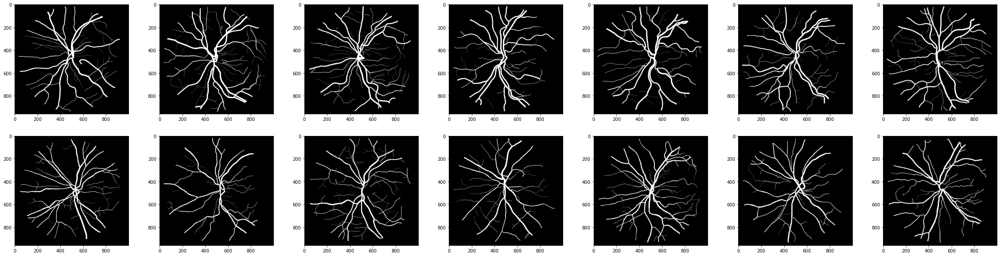

<Figure size 432x288 with 0 Axes>

In [20]:
L_1stHO = folders_path[0:1]

# Verify the right folder is chosen
print(L_1stHO)

L_1stHO_path = utils.get_files_path(L_1stHO[0])

black_df_L_1stHO = img_check.black_df(L_1stHO_path)
white_df_L_1stHO = img_check.white_df(L_1stHO_path)

wb_ratio_L_1stHO = img_check.wb_ratio_df(L_1stHO_path)

print("Max Number of Black Pixels is {}".format(black_df_L_1stHO['Black'].max()))
print("Min Number of Black Pixels is {}".format(black_df_L_1stHO['Black'].min()))
print('')
print("Max Number of White Pixels is {}".format(white_df_L_1stHO['White'].max()))
print("Min Number of White Pixels is {}".format(white_df_L_1stHO['White'].min()))
print('')
 
img_check.display_images(L_1stHO_path)

##### <b>Check L_2ndHO folder (2nd Manual Annotator Left Eye Mask)

* Number of White Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)

* Number of Black Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)
    
* White Black Ratio across each 14 images

['/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/L_2ndHO']
Max Number of Black Pixels is 903218
Min Number of Black Pixels is 881003

Max Number of White Pixels is 78037
Min Number of White Pixels is 55822



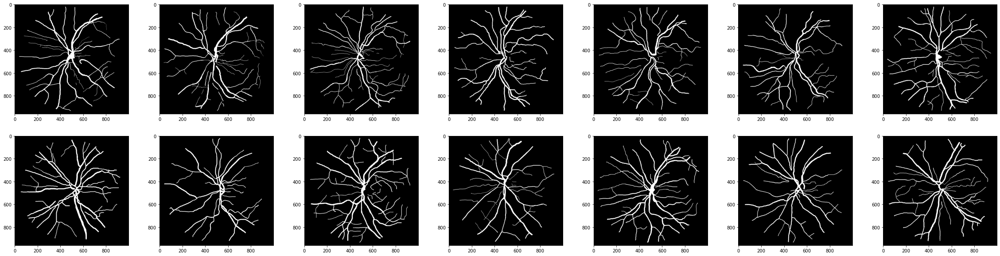

<Figure size 432x288 with 0 Axes>

In [21]:
L_2ndHO = folders_path[1:2]

# Verify the right folder is chosen
print(L_2ndHO)

L_2ndHO_path = utils.get_files_path(L_2ndHO[0])

black_df_L_2ndHO = img_check.black_df(L_2ndHO_path)
white_df_L_2ndHO = img_check.white_df(L_2ndHO_path)

wb_ratio_L_2ndHO = img_check.wb_ratio_df(L_2ndHO_path)

print("Max Number of Black Pixels is {}".format(black_df_L_2ndHO['Black'].max()))
print("Min Number of Black Pixels is {}".format(black_df_L_2ndHO['Black'].min()))
print('')
print("Max Number of White Pixels is {}".format(white_df_L_2ndHO['White'].max()))
print("Min Number of White Pixels is {}".format(white_df_L_2ndHO['White'].min()))
print('')

img_check.display_images(L_2ndHO_path)

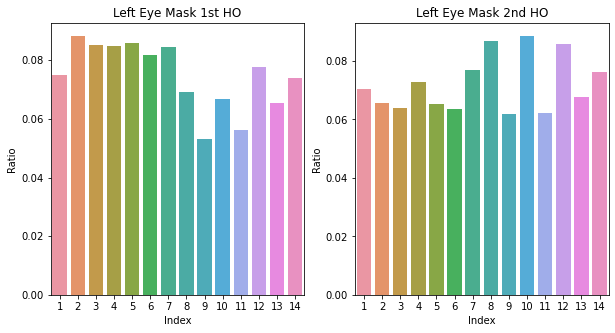

In [22]:
fig, ax =plt.subplots(1,2, figsize=(10,5))
sns.barplot(x="Index", y="Ratio", data=wb_ratio_L_1stHO, ax=ax[0]).set(title='Left Eye Mask 1st HO')
sns.barplot(x="Index", y="Ratio", data=wb_ratio_L_2ndHO, ax=ax[1]).set(title='Left Eye Mask 2nd HO')
plt.show()

## <b>Comparing Right Eye Masks White/Black Ratio between the 2 Annotators
    
* Using white black ratio as a guide to look at the differences per image

##### <b>Check R_1stHO folder (1st Manual Annotator Right Eye Mask) 

* Number of White Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)

* Number of Black Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)
    
* White Black Ratio across each 14 images

['/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_1stHO']
Max Number of Black Pixels is 910221
Min Number of Black Pixels is 877377

Max Number of White Pixels is 81663
Min Number of White Pixels is 48819



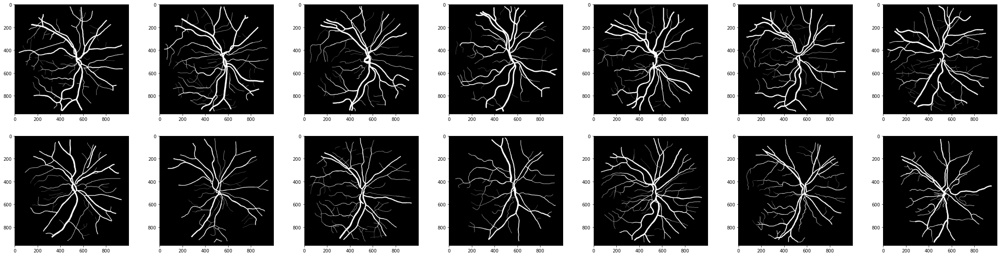

<Figure size 432x288 with 0 Axes>

In [23]:
R_1stHO = folders_path[2:3]

# Verify the right folder is chosen
print(R_1stHO)

R_1stHO_path = utils.get_files_path(R_1stHO[0])

black_df_R_1stHO = img_check.black_df(R_1stHO_path)
white_df_R_1stHO = img_check.white_df(R_1stHO_path)

wb_ratio_R_1stHO = img_check.wb_ratio_df(R_1stHO_path)

print("Max Number of Black Pixels is {}".format(black_df_R_1stHO['Black'].max()))
print("Min Number of Black Pixels is {}".format(black_df_R_1stHO['Black'].min()))
print('')
print("Max Number of White Pixels is {}".format(white_df_R_1stHO['White'].max()))
print("Min Number of White Pixels is {}".format(white_df_R_1stHO['White'].min()))
print('')

img_check.display_images(R_1stHO_path)

##### <b>Check R_2ndHO folder (2nd Manual Annotator Right Eye Mask)

* Number of White Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)

* Number of Black Pixels - Max Number(Upper Bound) and Min Number(Lower Bound)
    
* White Black Ratio across each 14 images

['/home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/R_2ndHO']
Max Number of Black Pixels is 906407
Min Number of Black Pixels is 880220

Max Number of White Pixels is 78820
Min Number of White Pixels is 52633



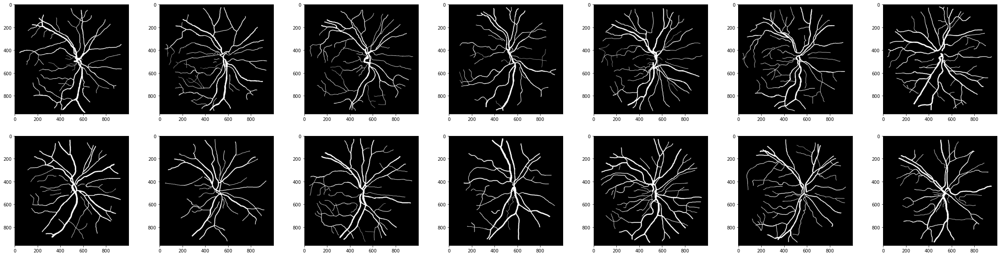

<Figure size 432x288 with 0 Axes>

In [24]:
R_2ndHO = folders_path[3:4]

# Verify the right folder is chosen
print(R_2ndHO)

R_2ndHO_path = utils.get_files_path(R_2ndHO[0])

black_df_R_2ndHO = img_check.black_df(R_2ndHO_path)
white_df_R_2ndHO = img_check.white_df(R_2ndHO_path)

wb_ratio_R_2ndHO = img_check.wb_ratio_df(R_2ndHO_path)

print("Max Number of Black Pixels is {}".format(black_df_R_2ndHO['Black'].max()))
print("Min Number of Black Pixels is {}".format(black_df_R_2ndHO['Black'].min()))
print('')
print("Max Number of White Pixels is {}".format(white_df_R_2ndHO['White'].max()))
print("Min Number of White Pixels is {}".format(white_df_R_2ndHO['White'].min()))
print('')

img_check.display_images(R_2ndHO_path)

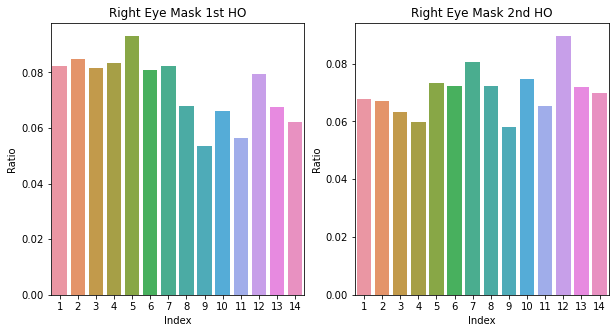

In [25]:
fig, ax =plt.subplots(1,2, figsize=(10,5))
sns.barplot(x="Index", y="Ratio", data=wb_ratio_R_1stHO, ax=ax[0]).set(title='Right Eye Mask 1st HO')
sns.barplot(x="Index", y="Ratio", data=wb_ratio_R_2ndHO, ax=ax[1]).set(title='Right Eye Mask 2nd HO')
plt.show()

## <b>Comparing Eye Masks White/Black Ratio between the 3 Mask Partitions
    
* Using white black ratio as a guide to look at the differences

In [26]:
mask_partition_paths

['/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/1',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/2',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/3']

In [27]:
# Mask Partition 1

mask_partition_1 = mask_partition_paths[0]

# Verify the right folder is chosen
print(mask_partition_1)

mask_p1_path = utils.get_files_path(mask_partition_1)

black_df_mask_p1 = img_check.black_df(mask_p1_path)
white_df_mask_p1 = img_check.white_df(mask_p1_path)

wb_ratio_mask_p1 = img_check.wb_ratio_df(mask_p1_path)

print("Max Number of Black Pixels is {}".format(black_df_mask_p1['Black'].max()))
print("Min Number of Black Pixels is {}".format(black_df_mask_p1['Black'].min()))
print('')
print("Max Number of White Pixels is {}".format(white_df_mask_p1['White'].max()))
print("Min Number of White Pixels is {}".format(white_df_mask_p1['White'].min()))
print('')

/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/1
Max Number of Black Pixels is 902931
Min Number of Black Pixels is 883844

Max Number of White Pixels is 75196
Min Number of White Pixels is 56109



In [28]:
# Mask Partition 2

mask_partition_2 = mask_partition_paths[1]

# Verify the right folder is chosen
print(mask_partition_2)

mask_p2_path = utils.get_files_path(mask_partition_2)

black_df_mask_p2 = img_check.black_df(mask_p2_path)
white_df_mask_p2 = img_check.white_df(mask_p2_path)

wb_ratio_mask_p2 = img_check.wb_ratio_df(mask_p2_path)

print("Max Number of Black Pixels is {}".format(black_df_mask_p2['Black'].max()))
print("Min Number of Black Pixels is {}".format(black_df_mask_p2['Black'].min()))
print('')
print("Max Number of White Pixels is {}".format(white_df_mask_p2['White'].max()))
print("Min Number of White Pixels is {}".format(white_df_mask_p2['White'].min()))
print('')

/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/2
Max Number of Black Pixels is 910516
Min Number of Black Pixels is 881220

Max Number of White Pixels is 77820
Min Number of White Pixels is 48524



In [29]:
# Mask Partition 3

mask_partition_3 = mask_partition_paths[2]

# Verify the right folder is chosen
print(mask_partition_3)

mask_p3_path = utils.get_files_path(mask_partition_3)

black_df_mask_p3 = img_check.black_df(mask_p3_path)
white_df_mask_p3 = img_check.white_df(mask_p3_path)

wb_ratio_mask_p3 = img_check.wb_ratio_df(mask_p3_path)

print("Max Number of Black Pixels is {}".format(black_df_mask_p3['Black'].max()))
print("Min Number of Black Pixels is {}".format(black_df_mask_p3['Black'].min()))
print('')
print("Max Number of White Pixels is {}".format(white_df_mask_p3['White'].max()))
print("Min Number of White Pixels is {}".format(white_df_mask_p3['White'].min()))
print('')

/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/mask/3
Max Number of Black Pixels is 907907
Min Number of Black Pixels is 877377

Max Number of White Pixels is 81663
Min Number of White Pixels is 51133



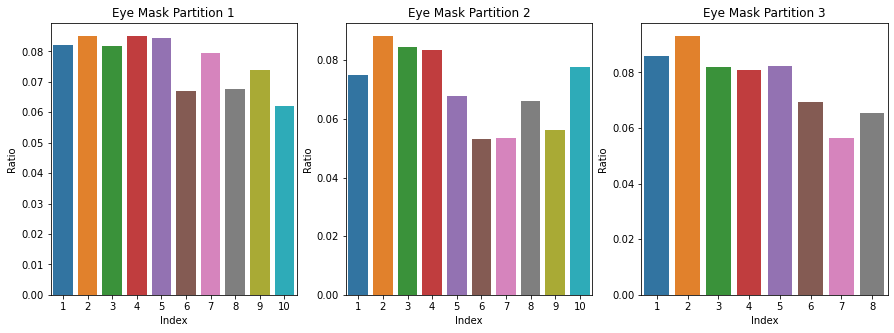

In [30]:
fig, ax =plt.subplots(1,3, figsize=(15,5))
sns.barplot(x="Index", y="Ratio", data=wb_ratio_mask_p1, ax=ax[0]).set(title='Eye Mask Partition 1')
sns.barplot(x="Index", y="Ratio", data=wb_ratio_mask_p2, ax=ax[1]).set(title='Eye Mask Partition 2')
sns.barplot(x="Index", y="Ratio", data=wb_ratio_mask_p3, ax=ax[2]).set(title='Eye Mask Partition 3')
plt.show()

## <b>Overlay and Compare Color Image and Mask (Single Image Color Histogram)

* Check histogram of each channel for the color image with Mask (Mask removes pixel counts where mask value is zero)
* This checks for contrast and intensity of colors in the images

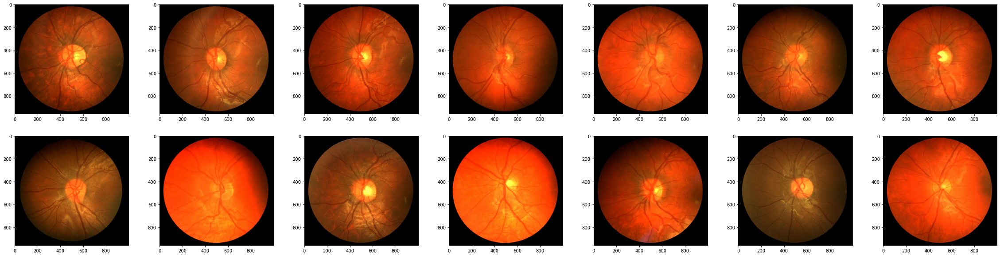

<Figure size 432x288 with 0 Axes>

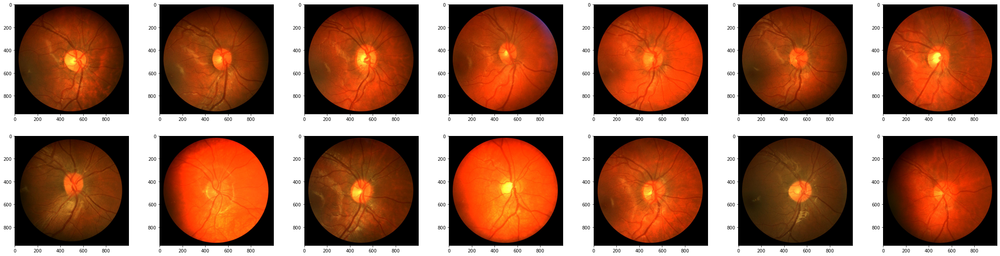

<Figure size 432x288 with 0 Axes>

In [31]:
# Display all color images
left_eye_list = utils.get_files_path('data/stratify_chasedb1/left')
right_eye_list = utils.get_files_path('data/stratify_chasedb1/right')

img_check.display_images(left_eye_list)
img_check.display_images(right_eye_list)

In [32]:
# Calculate histogram for 1 image

color_path = 'data/stratify_chasedb1/left/Image_01L.jpg'
mask_1_path = 'data/stratify_chasedb1/L_1stHO/Image_01L_1stHO.png'
mask_2_path = 'data/stratify_chasedb1/L_2ndHO/Image_01L_2ndHO.png'

rgb_df_m1 = img_check.get_rgb_df(color_path, mask_1_path)
rgb_df_m2 = img_check.get_rgb_df(color_path, mask_2_path)

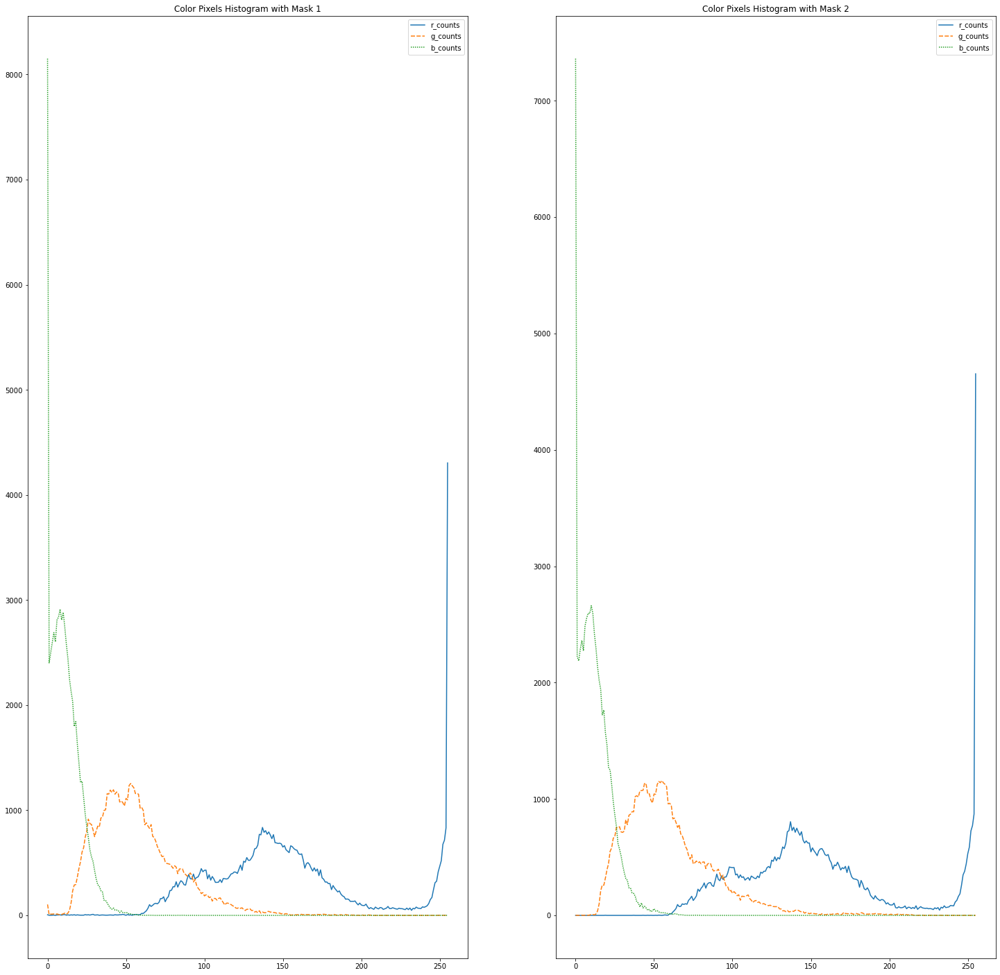

In [33]:
fig, ax =plt.subplots(1,2, figsize=(25,25))
sns.lineplot(data=rgb_df_m1, ax=ax[0]).set(title='Color Pixels Histogram with Mask 1')
sns.lineplot(data=rgb_df_m2, ax=ax[1]).set(title='Color Pixels Histogram with Mask 2')
plt.show()

## <b>Overlay and Compare Color Image and Mask (Gets 14 Images Average Color Histogram)

* Check average histogram of each channel for 14 color images with Mask (Mask removes pixel counts where mask value is zero)

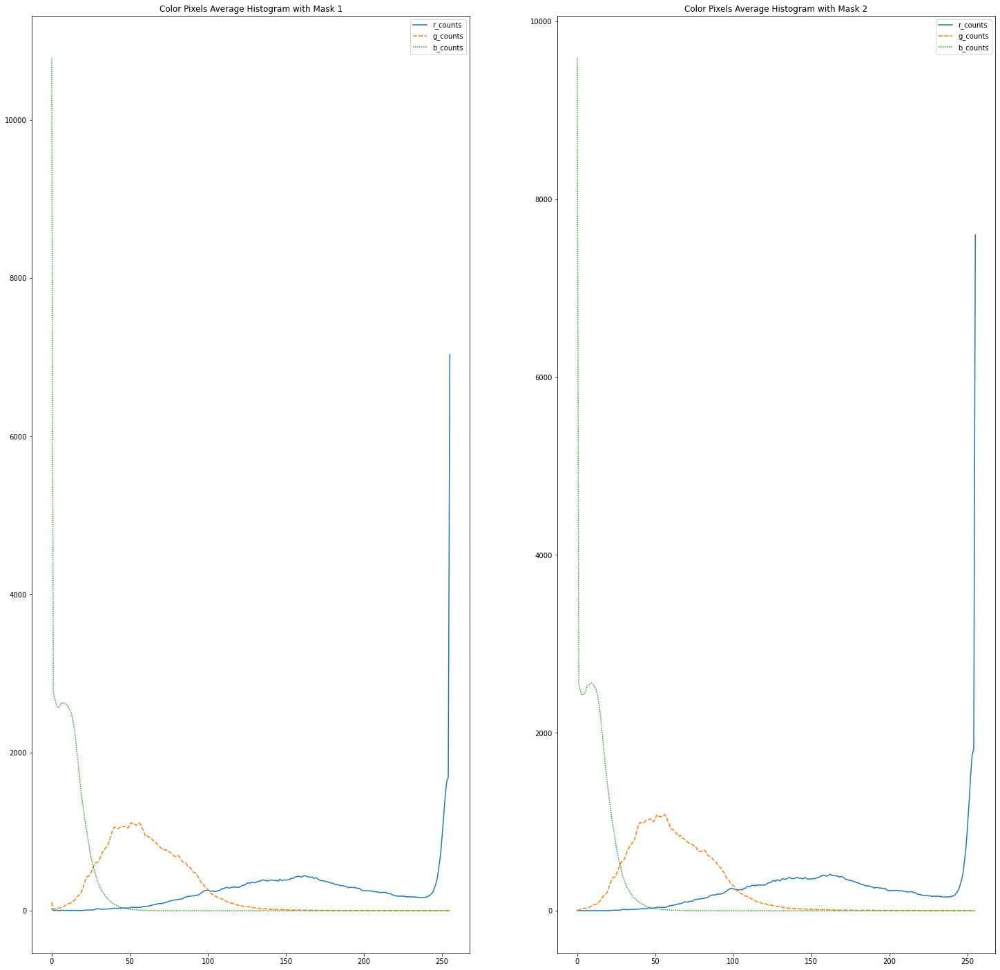

In [34]:
# Calculate avg histogram for 14 images of Left Eyes

color_paths = utils.get_files_path('data/stratify_chasedb1/left')
mask_1_paths = utils.get_files_path('data/stratify_chasedb1/L_1stHO/')
mask_2_paths = utils.get_files_path('data/stratify_chasedb1/L_2ndHO')

avg_rgb_df_m1 = img_check.get_avg_rgb_df(color_paths, mask_1_paths)
avg_rgb_df_m2 = img_check.get_avg_rgb_df(color_paths, mask_2_paths)

fig, ax =plt.subplots(1,2, figsize=(25,25))
sns.lineplot(data=avg_rgb_df_m1, ax=ax[0]).set(title='Color Pixels Average Histogram with Mask 1')
sns.lineplot(data=avg_rgb_df_m2, ax=ax[1]).set(title='Color Pixels Average Histogram with Mask 2')
plt.show()

## <b> Check 1 Image Color Histogram Deviation From 14 Images Average Color Histogram

* Check difference of average histogram of each channel for 14 color images with Mask (Mask removes pixel counts where mask value is zero) with 1 image histogram

In [35]:
# only the Left Eye

rgb_deviation_1 = rgb_df_m1.subtract(avg_rgb_df_m1).abs()
rgb_deviation_2 = rgb_df_m2.subtract(avg_rgb_df_m2).abs()

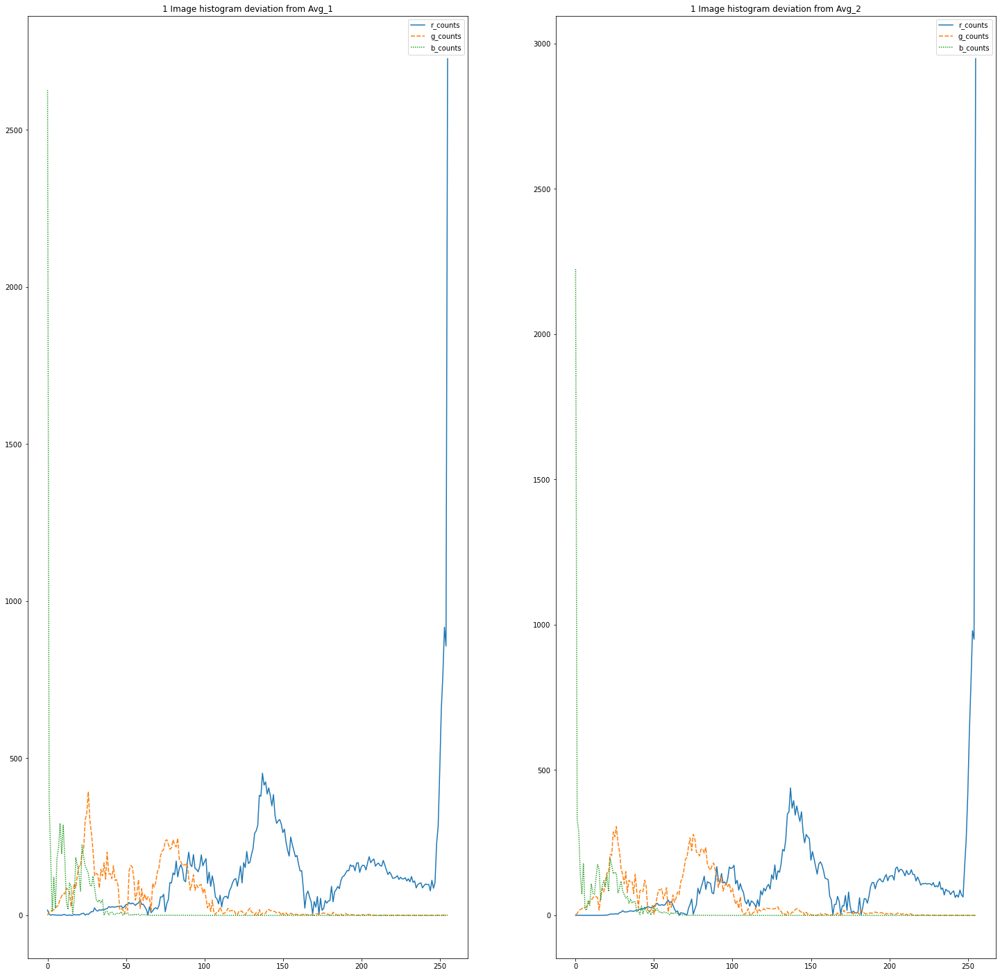

In [36]:
fig, ax =plt.subplots(1,2, figsize=(25,25))
sns.lineplot(data=rgb_deviation_1, ax=ax[0]).set(title='1 Image histogram deviation from Avg_1')
sns.lineplot(data=rgb_deviation_2, ax=ax[1]).set(title='1 Image histogram deviation from Avg_2')
plt.show()

## <b> Check 14 Images Color Histogram Deviation From 14 Images Average Color Histogram

In [37]:
color_paths = utils.get_files_path('data/stratify_chasedb1/left')
mask_1_paths = utils.get_files_path('data/stratify_chasedb1/L_1stHO/')

# Create a dictionary of image_path and mask_path

image_mask_dict = utils.create_image_mask_dict(color_paths, mask_1_paths)
total_pixels = (960 * 999 * 3)

all_left_rgb_dfs = img_check.get_all_rgb_dfs(image_mask_dict)
all_rgb_deviate_pct = img_check.rgb_deviate_pct(all_left_rgb_dfs, avg_rgb_df_m1, total_pixels)

all_rgb_deviate_pct

[0.018683638996138997,
 0.03446231449703672,
 0.031217452571619245,
 0.026267164982442758,
 0.02883858560941894,
 0.021088077164466052,
 0.023749121144954477,
 0.025116659318048205,
 0.043555038173093724,
 0.03245991527241528,
 0.047398315974704855,
 0.027515834286667627,
 0.039294726273892945,
 0.025864778468945134]

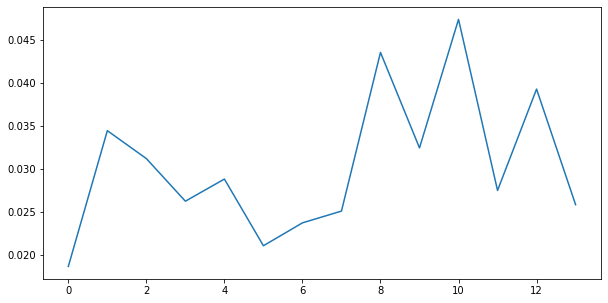

In [38]:
fig, ax= plt.subplots(1,1, figsize=(10,5))
sns.lineplot(data=all_rgb_deviate_pct)
plt.show()

## <b> Visualize Top 3 Deviation Image from 14 Images Average Color Histogram
    
* The biggest deviation are due to color contrast/intensity

0.043555038173093724


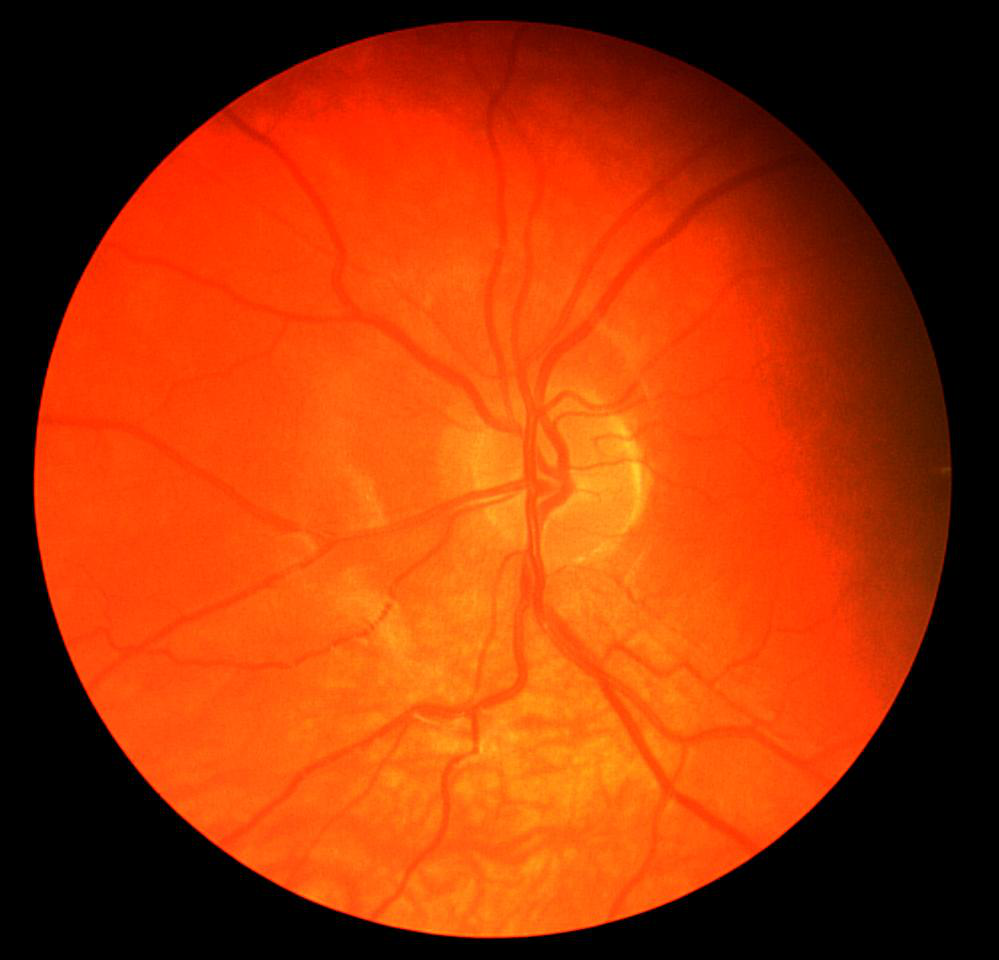

In [39]:
from PIL import Image

print(all_rgb_deviate_pct[8]) # which is image 9

im9 = Image.open('data/stratify_chasedb1/left/Image_09L.jpg')
im9

0.047398315974704855


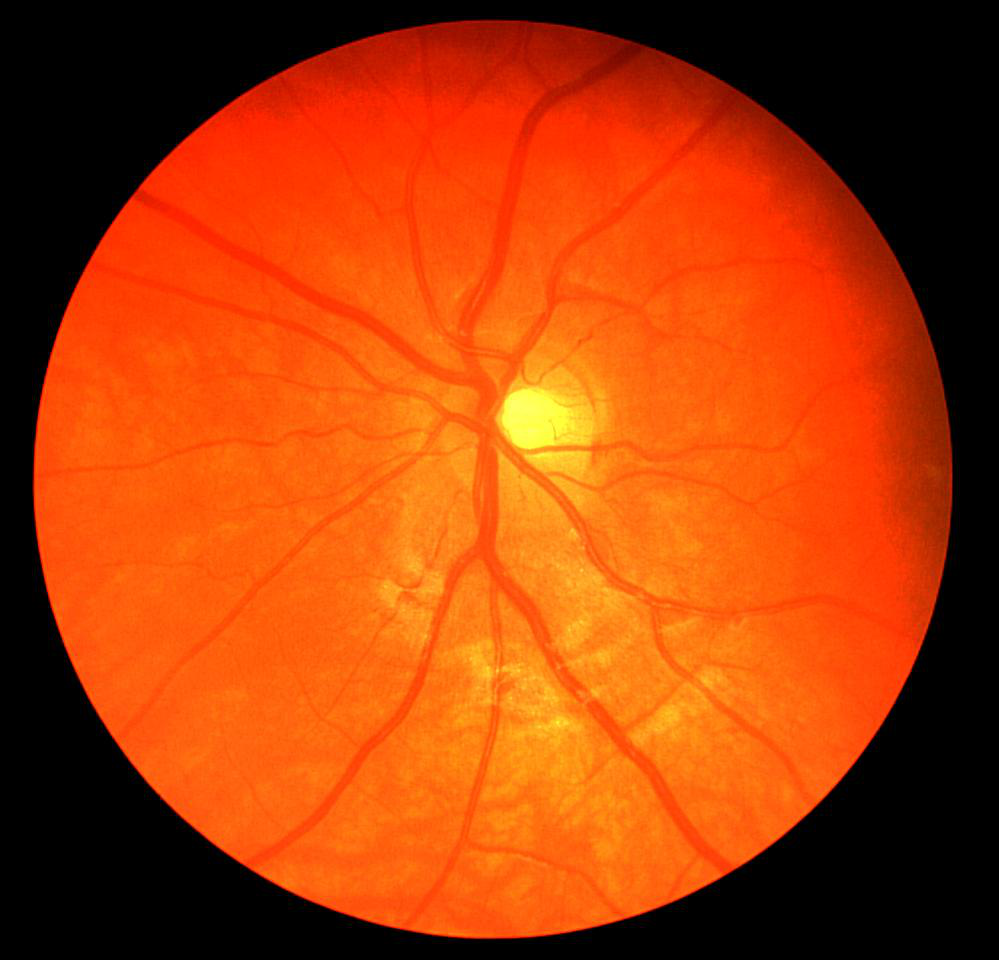

In [40]:
print(all_rgb_deviate_pct[10]) # which is image 11

im11 = Image.open('data/stratify_chasedb1/left/Image_11L.jpg')
im11

0.039294726273892945


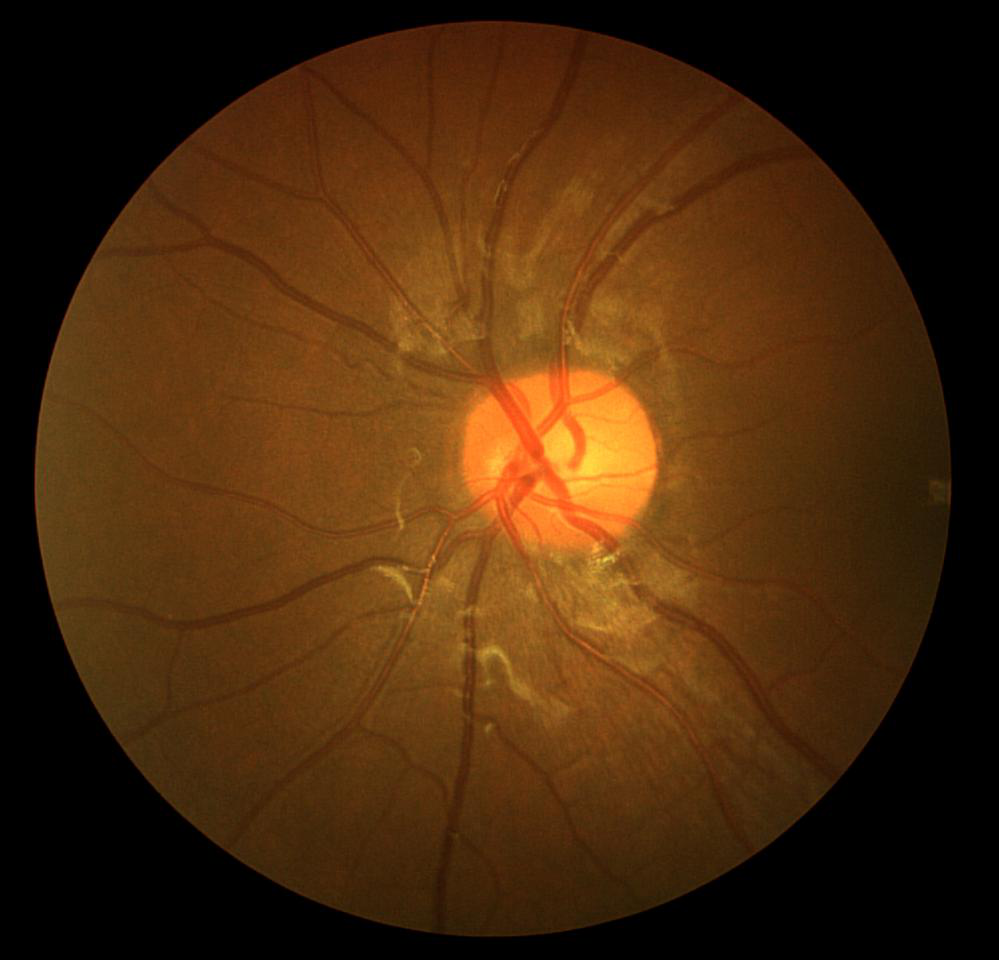

In [41]:
print(all_rgb_deviate_pct[12]) # which is image 13

im13 = Image.open('data/stratify_chasedb1/left/Image_13L.jpg')
im13

## <b> Check Each Partition Color Deviation From 28 Images Average Color Histogram
    
* To add later

## <b> Pixel Level Stats Exploration

In [42]:
image_partition_paths

['/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/1',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/2',
 '/home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/3']

In [43]:
# Get Array of Pixel-level Distribution

left_list_arr = img_check.get_pixels_array(left_image_paths)
right_list_arr = img_check.get_pixels_array(right_image_paths)

all_image_paths = utils.get_files_path(folders_path[4])
all_list_arr = img_check.get_pixels_array(all_image_paths)

# Get Array of Pixel-level Distribution by partition

image_p1_paths = utils.get_files_path(image_partition_paths[0])
p1_list_arr = img_check.get_pixels_array(image_p1_paths)

image_p2_paths = utils.get_files_path(image_partition_paths[1])
p2_list_arr = img_check.get_pixels_array(image_p2_paths)

image_p3_paths = utils.get_files_path(image_partition_paths[2])
p3_list_arr = img_check.get_pixels_array(image_p3_paths)

In [44]:
# Get Array of Pixel-level Mean Distribution

left_mean_arr = img_check.get_pixels_mean(left_list_arr)
right_mean_arr = img_check.get_pixels_mean(right_list_arr)
all_mean_arr = img_check.get_pixels_mean(all_list_arr)

# Get Array of Pixel-level Mean Distribution by partition

p1_mean_arr = img_check.get_pixels_mean(p1_list_arr)
p2_mean_arr = img_check.get_pixels_mean(p2_list_arr)
p3_mean_arr = img_check.get_pixels_mean(p3_list_arr)

In [45]:
# Get Array of Pixel-level Standard Deviation Distribution

left_std_arr = img_check.get_pixels_std(left_list_arr)
right_std_arr = img_check.get_pixels_std(right_list_arr)
all_std_arr = img_check.get_pixels_std(all_list_arr)

# Get Array of Pixel-level Standard Deviation Distribution by partition

p1_std_arr = img_check.get_pixels_std(p1_list_arr)
p2_std_arr = img_check.get_pixels_std(p2_list_arr)
p3_std_arr = img_check.get_pixels_std(p3_list_arr)

In [46]:
# Get Average Image from Pixel Mean Array

left_average_image = img_check.get_average_image(left_mean_arr)
right_average_image = img_check.get_average_image(right_mean_arr)
all_average_image = img_check.get_average_image(all_mean_arr)

# Get Average Image from Pixel Mean Array by partition

p1_average_image = img_check.get_average_image(p1_mean_arr)
p2_average_image = img_check.get_average_image(p2_mean_arr)
p3_average_image = img_check.get_average_image(p3_mean_arr)

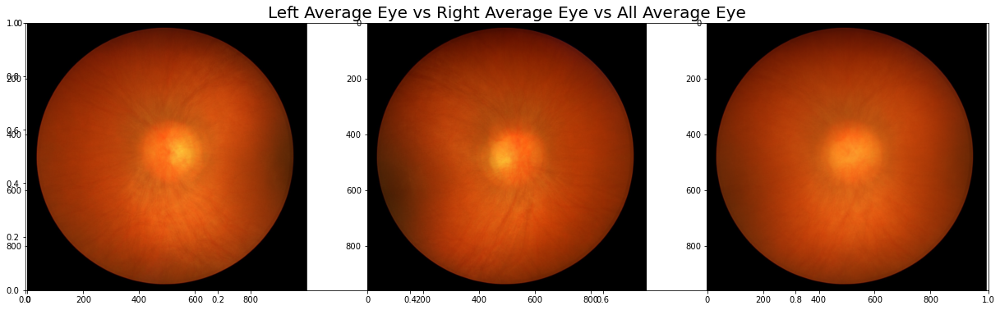

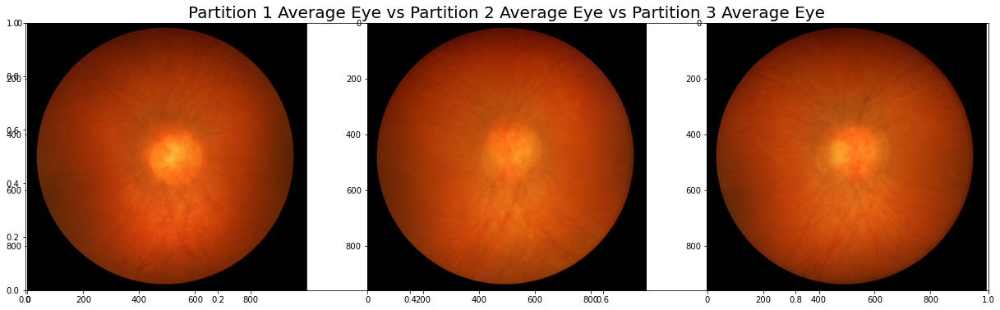

In [47]:
fig = plt.figure(figsize=(21,6))
plt.title('Left Average Eye vs Right Average Eye vs All Average Eye', fontsize=20)
rows=1
columns=3
fig.add_subplot(rows, columns, 1)
plt.imshow(left_average_image)
fig.add_subplot(rows, columns, 2)
plt.imshow(right_average_image)
fig.add_subplot(rows, columns, 3)
plt.imshow(all_average_image)
plt.show()

fig = plt.figure(figsize=(21,6))
plt.title('Partition 1 Average Eye vs Partition 2 Average Eye vs Partition 3 Average Eye', fontsize=20)
rows=1
columns=3
fig.add_subplot(rows, columns, 1)
plt.imshow(p1_average_image)
fig.add_subplot(rows, columns, 2)
plt.imshow(p2_average_image)
fig.add_subplot(rows, columns, 3)
plt.imshow(p3_average_image)
plt.show()

## <b> Calculation for Deviation for Left Eyes

In [48]:
left_abs_total_deviation, left_sum_deviations = img_check.get_deviation(left_image_paths, left_mean_arr, channel = 3)
left_min_index, left_max_index, left_mean_deviation = img_check.min_max_deviation(left_sum_deviations, left_image_paths)


min index is 6 and the corresponding min value is 21280866.571428575         
max index is 10 and corresponding max value is 71405628.14285716
Mean deviation is 40140640.40816326
Min image is data/stratify_chasedb1/left/Image_07L.jpg and max image is data/stratify_chasedb1/left/Image_11L.jpg


## <b> Calculation for Deviation for Right Eyes

In [49]:
right_abs_total_deviation, right_sum_deviations = img_check.get_deviation(right_image_paths, right_mean_arr, channel = 3)
right_min_index, right_max_index, right_mean_deviation = img_check.min_max_deviation(right_sum_deviations, right_image_paths)

min index is 2 and the corresponding min value is 21748465.71428572         
max index is 10 and corresponding max value is 74959339.57142858
Mean deviation is 38790910.60204082
Min image is data/stratify_chasedb1/right/Image_03R.jpg and max image is data/stratify_chasedb1/right/Image_11R.jpg


## <b> Calculation for Deviation for All Eyes

In [50]:
all_abs_total_deviation, all_sum_deviations = img_check.get_deviation(all_image_paths, all_mean_arr, channel = 3)
all_min_index, all_max_index, all_mean_deviation = img_check.min_max_deviation(all_sum_deviations, all_image_paths)

min index is 23 and the corresponding min value is 21662053.14285714         
max index is 20 and corresponding max value is 76746697.57142855
Mean deviation is 40863433.18622448
Min image is /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all/Image_12R.jpg and max image is /home/chrisho/Projects/fedseg/eda_chase_57/data/stratify_chasedb1/all/Image_11L.jpg


## <b> Calculation for Deviation for Partition 1

In [51]:
p1_abs_total_deviation, p1_sum_deviations = img_check.get_deviation(image_p1_paths, p1_mean_arr, channel = 3)
p1_min_index, p1_max_index, partition_1_deviation = img_check.min_max_deviation(p1_sum_deviations, image_p1_paths)

min index is 1 and the corresponding min value is 21772262.70000001         
max index is 8 and corresponding max value is 55477024.09999997
Mean deviation is 32197592.77999999
Min image is /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/1/Image_03L.jpg and max image is /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/1/Image_14L.jpg


## <b> Calculation for Deviation for Partition 2

In [52]:
p2_abs_total_deviation, p2_sum_deviations = img_check.get_deviation(image_p2_paths, p2_mean_arr, channel = 3)
p2_min_index, p2_max_index, partition_2_deviation = img_check.min_max_deviation(p2_sum_deviations, image_p2_paths)

min index is 3 and the corresponding min value is 24799735.69999998         
max index is 8 and corresponding max value is 70461227.69999999
Mean deviation is 45963319.25999999
Min image is /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/2/Image_04R.jpg and max image is /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/2/Image_11L.jpg


## <b> Calculation for Deviation for Partition 3

In [53]:
p3_abs_total_deviation, p3_sum_deviations = img_check.get_deviation(image_p3_paths, p3_mean_arr, channel = 3)
p3_min_index, p3_max_index, partition_3_deviation = img_check.min_max_deviation(p3_sum_deviations, image_p3_paths)

min index is 4 and the corresponding min value is 26968596.5         
max index is 6 and corresponding max value is 68025330.75
Mean deviation is 43140376.40625
Min image is /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/3/Image_07R.jpg and max image is /home/chrisho/Projects/fedseg/eda_chase_57/data/partition/images/3/Image_11R.jpg


## <b> Plot Average Pixels Deviations Left, Right , All, Partition 1-3

In [54]:
total_pixels = (999*960*3)

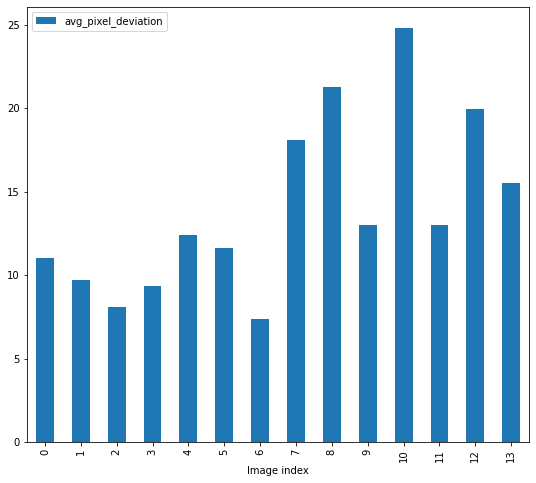

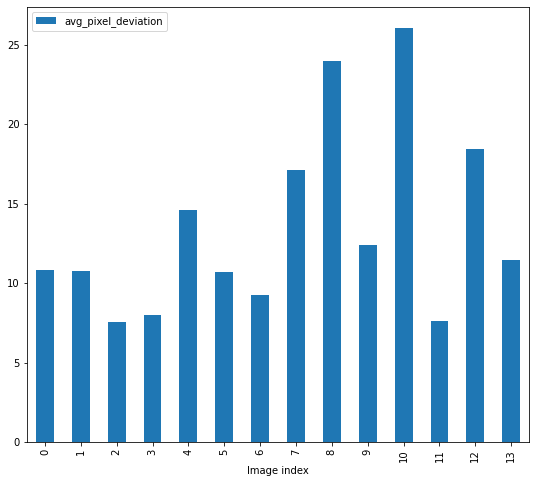

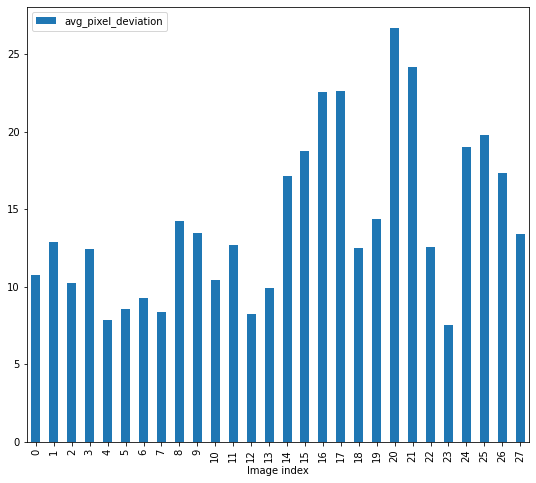

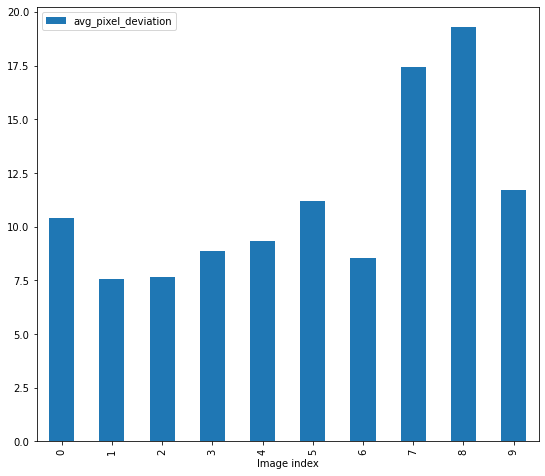

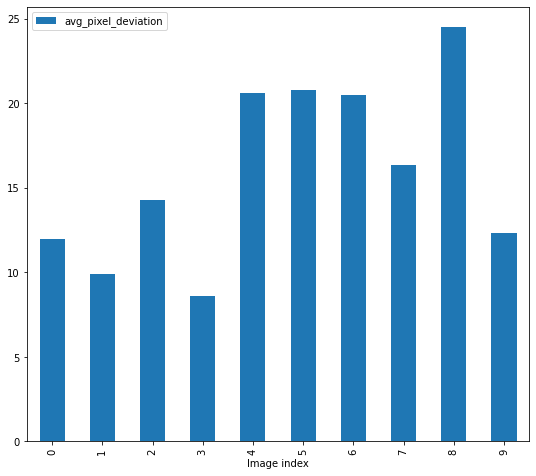

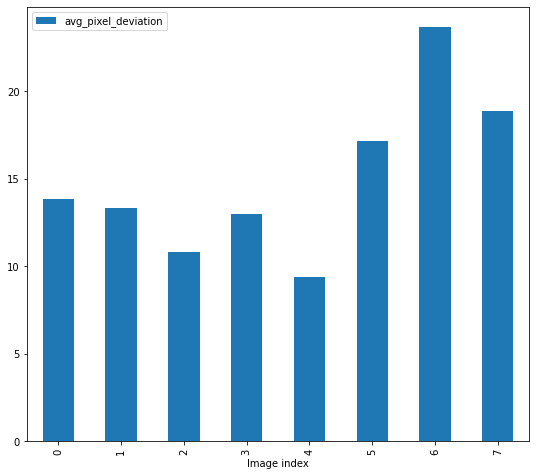

In [55]:
left_deviation_df = img_check.plot_image(left_sum_deviations, total_pixels)
right_deviation_df = img_check.plot_image(right_sum_deviations, total_pixels)
all_deviation_df = img_check.plot_image(all_sum_deviations, total_pixels)
partition_1_df = img_check.plot_image(p1_sum_deviations, total_pixels)
partition_2_df = img_check.plot_image(p2_sum_deviations, total_pixels)
partition_3_df = img_check.plot_image(p3_sum_deviations, total_pixels)

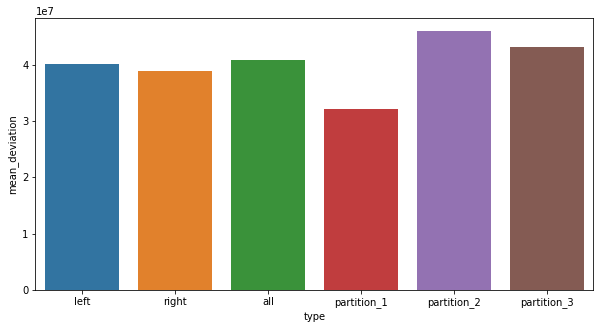

In [56]:
mean_list = {'type': ['left', 'right', 'all', 'partition_1', 'partition_2',     'partition_3'], 'mean_deviation': [left_mean_deviation, right_mean_deviation, all_mean_deviation, partition_1_deviation, partition_2_deviation, partition_3_deviation]}
mean_df = pd.DataFrame.from_dict(data=mean_list)

mean_df
fig, ax= plt.subplots(1,1, figsize=(10,5))
sns.barplot(data=mean_df, x = 'type', y = 'mean_deviation')
plt.show()

## <b> Compare Images - Actual, Average, Deviated (Example: Right Eye)

In [57]:
def compare_images(min_index, list_arr, max_index, abs_total_deviation):
    actual_min = img_check.show_actual_images(min_index, list_arr)
    deviated_min = img_check.show_actual_images(min_index, abs_total_deviation)
    actual_max = img_check.show_actual_images(max_index, list_arr)
    deviated_max = img_check.show_actual_images(max_index, abs_total_deviation)
    return actual_min, deviated_min, actual_max, deviated_max

right_actual_min, right_deviated_min, right_actual_max, right_deviated_max = compare_images(right_min_index, right_list_arr, right_max_index, right_abs_total_deviation)

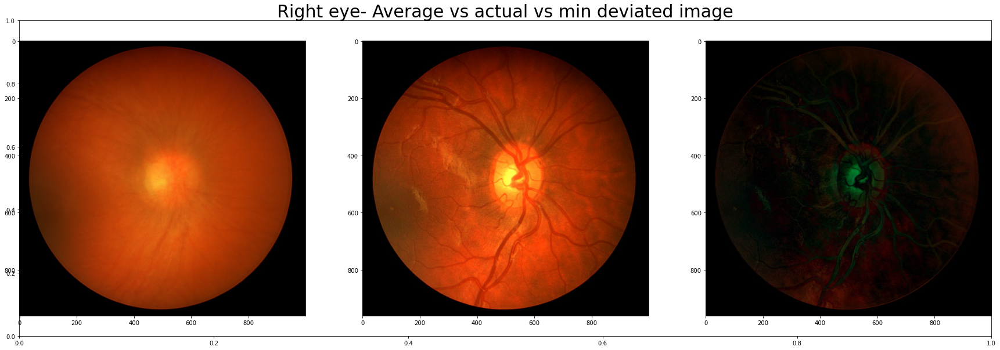

In [58]:
fig = plt.figure(figsize=(30, 10))
plt.title('Right eye- Average vs actual vs min deviated image',fontsize=30)
rows = 1
columns = 3
fig.add_subplot(rows, columns, 1)
plt.imshow(right_average_image)
fig.add_subplot(rows, columns, 2)
plt.imshow(right_actual_min)
fig.add_subplot(rows, columns, 3)
plt.imshow(right_deviated_min)
plt.show()


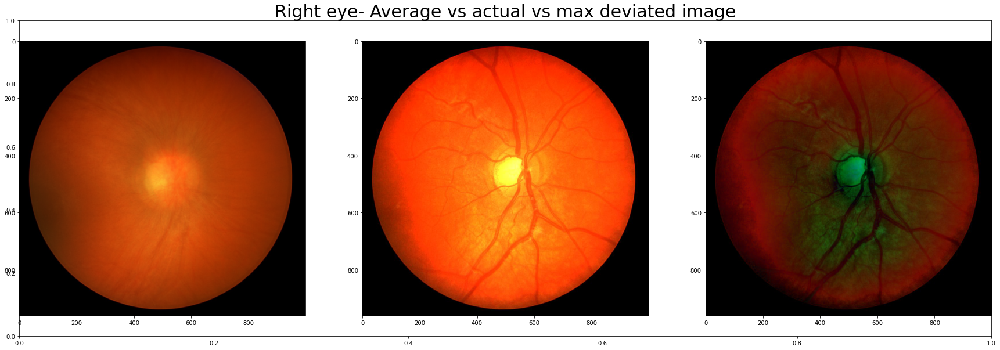

In [59]:
fig = plt.figure(figsize=(30, 10))
rows = 1
columns = 3
plt.title('Right eye- Average vs actual vs max deviated image',fontsize=30)
fig.add_subplot(rows, columns, 1)
plt.imshow(right_average_image)
fig.add_subplot(rows, columns, 2)
plt.imshow(right_actual_max)
fig.add_subplot(rows, columns, 3)
plt.imshow(right_deviated_max)
plt.show()

In [60]:
p1_actual_min, p1_deviated_min, p1_actual_max, p1_deviated_max = compare_images(p1_min_index, p1_list_arr, p1_max_index, p1_abs_total_deviation)

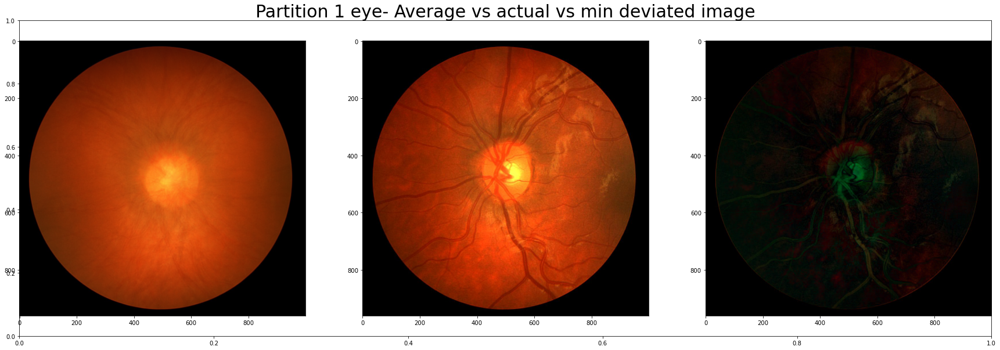

In [61]:
fig = plt.figure(figsize=(30, 10))
plt.title('Partition 1 eye- Average vs actual vs min deviated image',fontsize=30)
rows = 1
columns = 3
fig.add_subplot(rows, columns, 1)
plt.imshow(p1_average_image)
fig.add_subplot(rows, columns, 2)
plt.imshow(p1_actual_min)
fig.add_subplot(rows, columns, 3)
plt.imshow(p1_deviated_min)
plt.show()


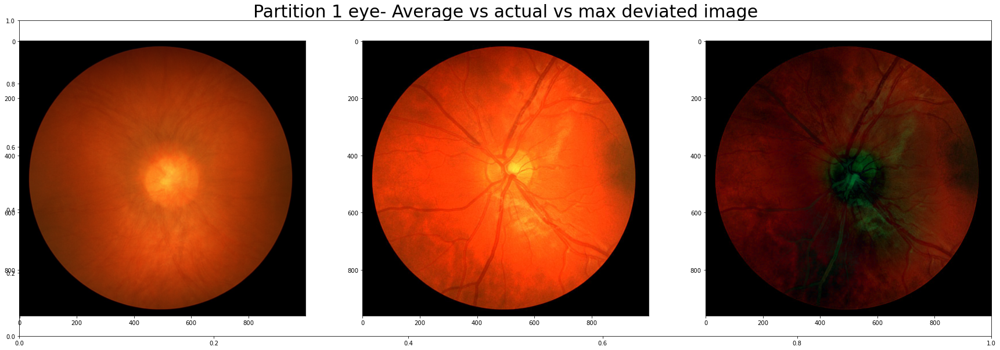

In [62]:
fig = plt.figure(figsize=(30, 10))
plt.title('Partition 1 eye- Average vs actual vs max deviated image',fontsize=30)
rows = 1
columns = 3
fig.add_subplot(rows, columns, 1)
plt.imshow(p1_average_image)
fig.add_subplot(rows, columns, 2)
plt.imshow(p1_actual_max)
fig.add_subplot(rows, columns, 3)
plt.imshow(p1_deviated_max)
plt.show()

## <b>Plotting of Pixel Stats Graphs and Histogram (Right eye)

In [63]:
def plot_histogram(pixel_mean, pixel_std, pixel_distribution, abs_total_deviation, index):
    pixel_mean_hist,bin = np.histogram(pixel_mean.ravel(),256,[0,255])
    pixel_std_hist,bin = np.histogram(pixel_std.ravel(),256,[0,255])
    actual_image,bin = np.histogram(pixel_distribution[index,:,:].ravel(),256,[0,255])
    deviation_image, bin = np.histogram(abs_total_deviation[index,:,:].ravel(),256,[0,255])
    plt.figure(figsize=(15,10))
    plt.xlim([0,255])
    plt.plot(pixel_mean_hist, color = 'red')
    plt.plot(pixel_std_hist, color = 'blue')
    plt.plot(actual_image, color = 'black')
    plt.plot(deviation_image, color = 'green')
    plt.title('histogram of pixel_mean')
    plt.xlabel("Pixel intensity value")
    plt.ylabel("Frequency, # of pixels")
    plt.legend(['Pixel_mean', 'Pixel_std', 
    'actual_image', 'deviation_image'])
    plt.show()

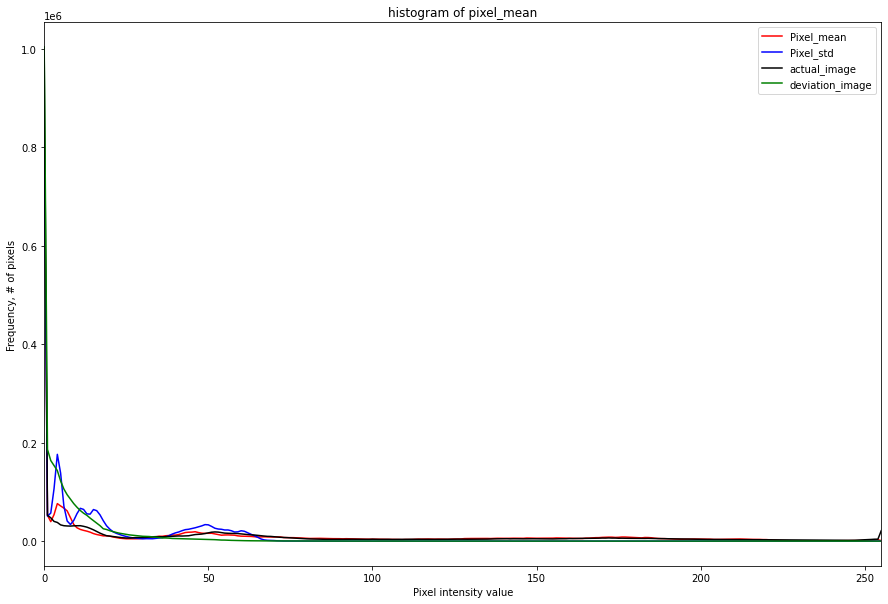

In [64]:
plot_histogram(right_mean_arr, right_std_arr, right_list_arr, right_abs_total_deviation, right_min_index)


In [65]:
## <b>Plotting of Pixel Stats Graphs and Histogram (Partition_1 eye)

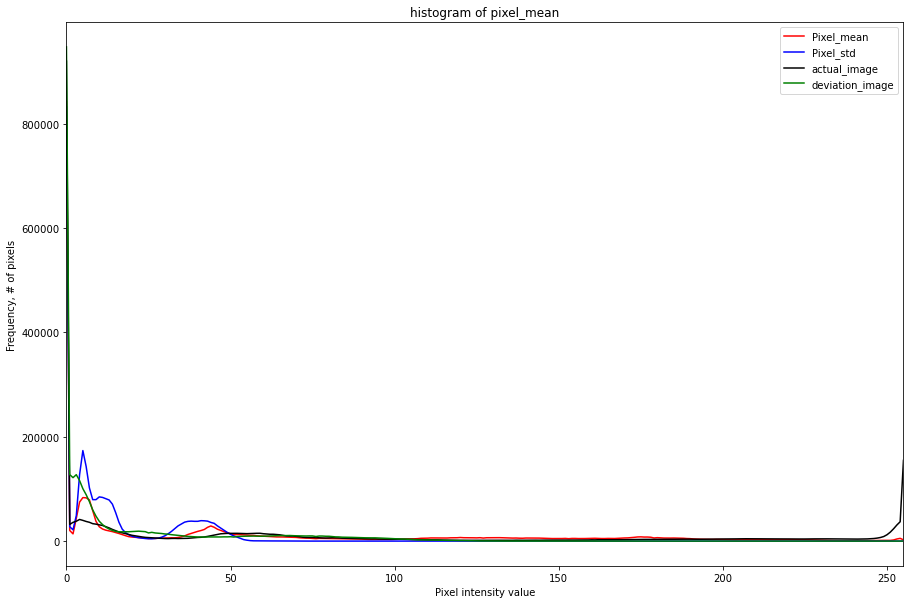

In [66]:
plot_histogram(p1_mean_arr, p1_std_arr, p1_list_arr, p1_abs_total_deviation, p1_max_index)